# Algoritmos de clasificación de texto

**Librerías para NLP**

NLTK: Esta es la lib con la que todos empiezan, sirve mucho para pre-procesamiento, crear los tokens, stemming, POS tagging, etc https://www.nltk.org/

TextBlob: fue creada encima de NLYK y es fácil de usar. Incluye algunas funcionalidades adicionales como análisis de sentimiento y spell check. https://textblob.readthedocs.io/en/dev/

Gensim: contruida específicamente para modelado de temas e incluye multiples técnicas (LDA y LSI). También calcula similitud de documentos. https://radimrehurek.com/gensim/

SpaCy: Puede hacer muchísimas cosas al estilo de NLTK pero es bastante más rápido. https://spacy.io/

## Desambiguación

Al trabajar con texto existe la posibilidad de encontrarnos con la misma palabra pero con diferente significado, esto se da porque el lenguaje humano es difuso y necesita mucho contexto

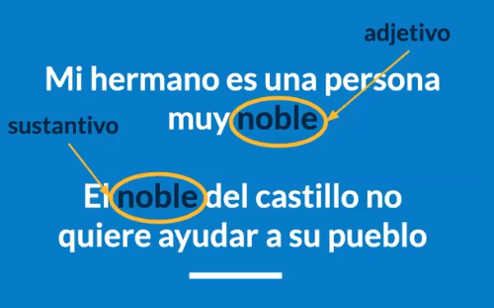

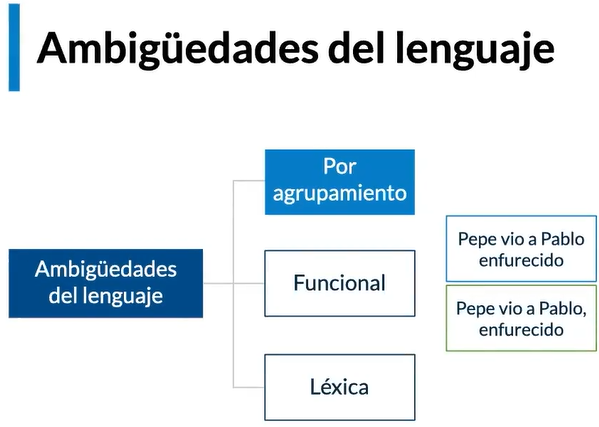

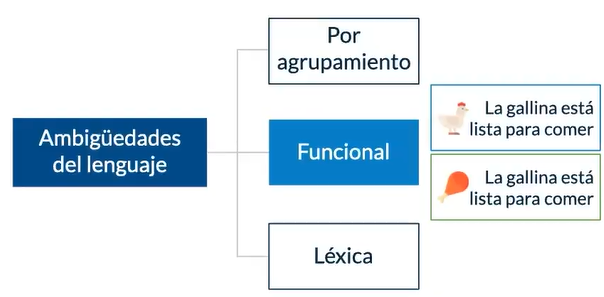

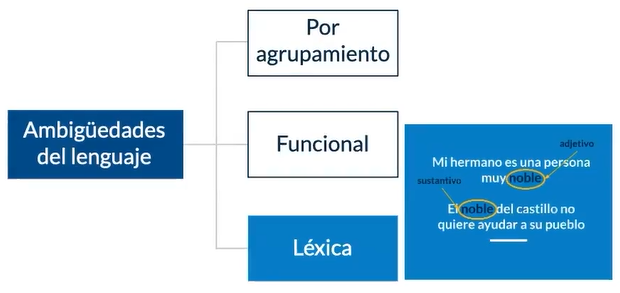

## Etiquetado con NLTK

### Pipeline básico en  inglés

In [1]:
import nltk
nltk.download("punkt")
nltk.download("averaged_perceptron_tagger")
from nltk import word_tokenize

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\JUAN\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\JUAN\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [2]:
text = word_tokenize("And now here I am enjoying today")
nltk.pos_tag(text)

[('And', 'CC'),
 ('now', 'RB'),
 ('here', 'RB'),
 ('I', 'PRP'),
 ('am', 'VBP'),
 ('enjoying', 'VBG'),
 ('today', 'NN')]

In [3]:
nltk.download("tagsets")

for _, tag in nltk.pos_tag(text):
    print(nltk.help.upenn_tagset(tag))

CC: conjunction, coordinating
    & 'n and both but either et for less minus neither nor or plus so
    therefore times v. versus vs. whether yet
None
RB: adverb
    occasionally unabatingly maddeningly adventurously professedly
    stirringly prominently technologically magisterially predominately
    swiftly fiscally pitilessly ...
None
RB: adverb
    occasionally unabatingly maddeningly adventurously professedly
    stirringly prominently technologically magisterially predominately
    swiftly fiscally pitilessly ...
None
PRP: pronoun, personal
    hers herself him himself hisself it itself me myself one oneself ours
    ourselves ownself self she thee theirs them themselves they thou thy us
None
VBP: verb, present tense, not 3rd person singular
    predominate wrap resort sue twist spill cure lengthen brush terminate
    appear tend stray glisten obtain comprise detest tease attract
    emphasize mold postpone sever return wag ...
None
VBG: verb, present participle or gerund
    te

[nltk_data] Downloading package tagsets to
[nltk_data]     C:\Users\JUAN\AppData\Roaming\nltk_data...
[nltk_data]   Package tagsets is already up-to-date!


In [4]:
text = word_tokenize("They do not permit other people to get residence permit")
nltk.pos_tag(text)

[('They', 'PRP'),
 ('do', 'VBP'),
 ('not', 'RB'),
 ('permit', 'VB'),
 ('other', 'JJ'),
 ('people', 'NNS'),
 ('to', 'TO'),
 ('get', 'VB'),
 ('residence', 'NN'),
 ('permit', 'NN')]

### Etiquetado en español

In [5]:
nltk.download("cess_esp")
from nltk.corpus import cess_esp as cess
from nltk import UnigramTagger as ut
from nltk import BigramTagger as bt

[nltk_data] Downloading package cess_esp to
[nltk_data]     C:\Users\JUAN\AppData\Roaming\nltk_data...
[nltk_data]   Package cess_esp is already up-to-date!


In [6]:
cess_sents = cess.tagged_sents()
fraction = int(len(cess_sents) * 0.9)

uni_tagger = ut(cess_sents[:fraction])
uni_tagger.accuracy(cess_sents[fraction + 1:])

0.8069484240687679

In [7]:
uni_tagger.tag("Yo soy una persona muy amable".split())

[('Yo', 'pp1csn00'),
 ('soy', 'vsip1s0'),
 ('una', 'di0fs0'),
 ('persona', 'ncfs000'),
 ('muy', 'rg'),
 ('amable', None)]

In [8]:
bi_tagger = bt(cess_sents[:fraction])
bi_tagger.accuracy(cess_sents[fraction + 1:])

0.1095272206303725

In [9]:
bi_tagger.tag("Yo soy una persona muy amable".split())

[('Yo', 'pp1csn00'),
 ('soy', 'vsip1s0'),
 ('una', None),
 ('persona', None),
 ('muy', None),
 ('amable', None)]

## Etiquetado con stanza

In [10]:
import stanza
stanza.download("es")

2024-05-29 10:27:38 INFO: Downloaded file to C:\Users\JUAN\stanza_resources\resources.json
2024-05-29 10:27:38 INFO: Downloading default packages for language: es (Spanish) ...
2024-05-29 10:27:40 INFO: File exists: C:\Users\JUAN\stanza_resources\es\default.zip
2024-05-29 10:27:43 INFO: Finished downloading models and saved to C:\Users\JUAN\stanza_resources


In [11]:
nlp = stanza.Pipeline("es",
                      processors="tokenize, pos")
doc = nlp("Yo soy una persona muy amable")

2024-05-29 10:27:43 INFO: Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


2024-05-29 10:27:44 INFO: Downloaded file to C:\Users\JUAN\stanza_resources\resources.json
2024-05-29 10:27:44 WARNING: Language es package default expects mwt, which has been added
2024-05-29 10:27:44 INFO: Loading these models for language: es (Spanish):
| Processor | Package       |
-----------------------------
| tokenize  | ancora        |
| mwt       | ancora        |
| pos       | ancora_charlm |

2024-05-29 10:27:44 INFO: Using device: cpu
2024-05-29 10:27:44 INFO: Loading: tokenize
2024-05-29 10:27:45 INFO: Loading: mwt
2024-05-29 10:27:45 INFO: Loading: pos
2024-05-29 10:27:45 INFO: Done loading processors!


In [12]:
doc

[
  [
    {
      "id": 1,
      "text": "Yo",
      "upos": "PRON",
      "xpos": "pp1csn00",
      "feats": "Case=Nom|Number=Sing|Person=1|PronType=Prs",
      "start_char": 0,
      "end_char": 2
    },
    {
      "id": 2,
      "text": "soy",
      "upos": "AUX",
      "xpos": "vsip1s0",
      "feats": "Mood=Ind|Number=Sing|Person=1|Tense=Pres|VerbForm=Fin",
      "start_char": 3,
      "end_char": 6
    },
    {
      "id": 3,
      "text": "una",
      "upos": "DET",
      "xpos": "di0fs0",
      "feats": "Definite=Ind|Gender=Fem|Number=Sing|PronType=Art",
      "start_char": 7,
      "end_char": 10
    },
    {
      "id": 4,
      "text": "persona",
      "upos": "NOUN",
      "xpos": "ncfs000",
      "feats": "Gender=Fem|Number=Sing",
      "start_char": 11,
      "end_char": 18
    },
    {
      "id": 5,
      "text": "muy",
      "upos": "ADV",
      "xpos": "rg",
      "start_char": 19,
      "end_char": 22
    },
    {
      "id": 6,
      "text": "amable",
      "upos":

In [13]:
for sentence in doc.sentences:
    for word in sentence.words:
        print(word.text + "\t"*2 + word.upos)

Yo		PRON
soy		AUX
una		DET
persona		NOUN
muy		ADV
amable		ADJ


## Cadenas de markov

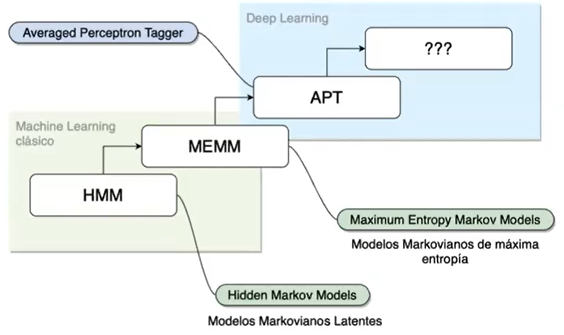

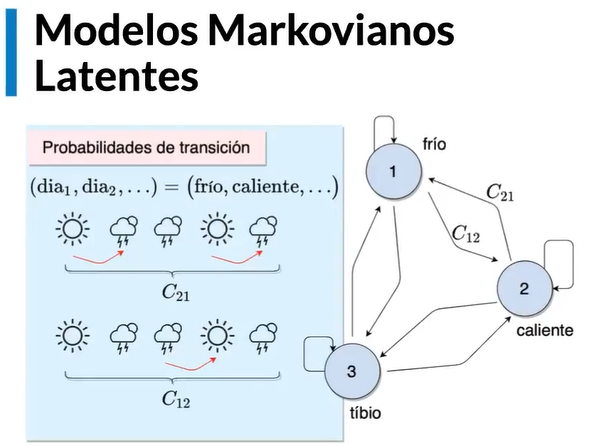

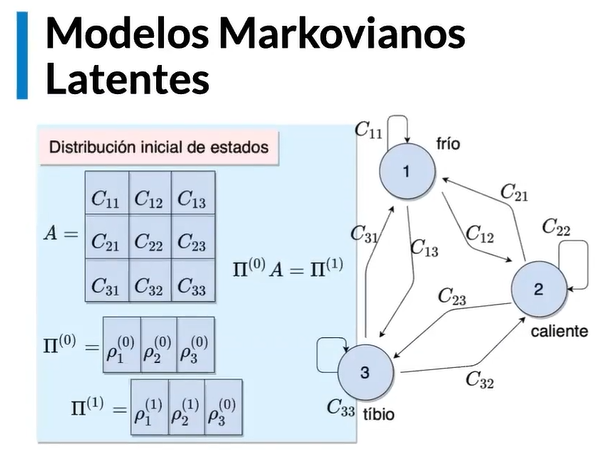

### Modelos Markovianos latentes (HMM)

El objetivo de una cadena de markov latente es encontrar dada una secuencia de palabras cuál es la secuencia de etiquetas que le corresponde con mayor probabilidad

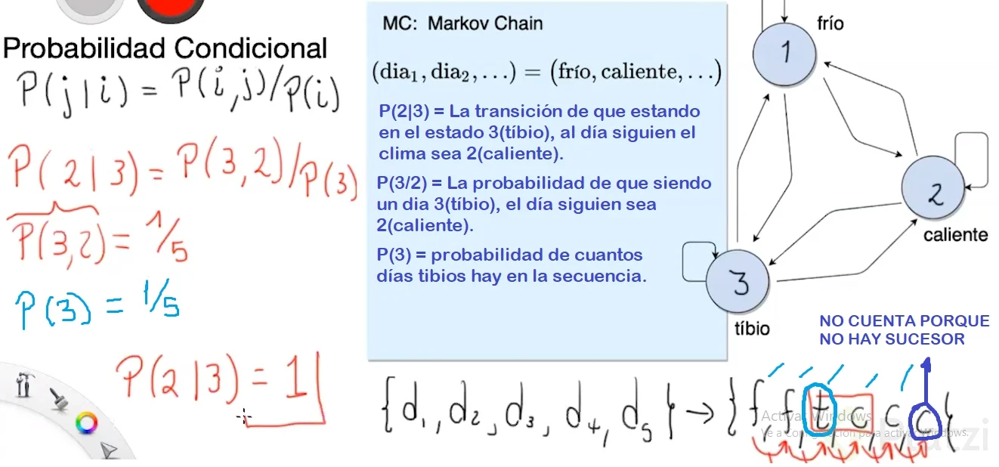

### Entrenando un HMM

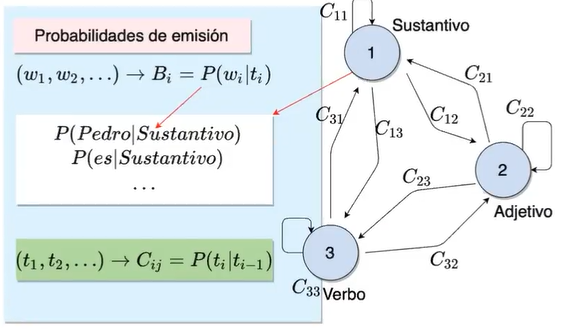

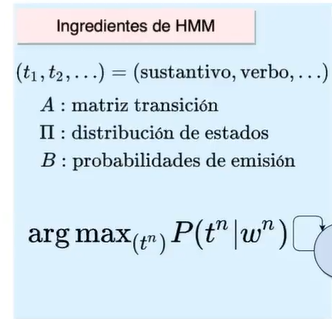

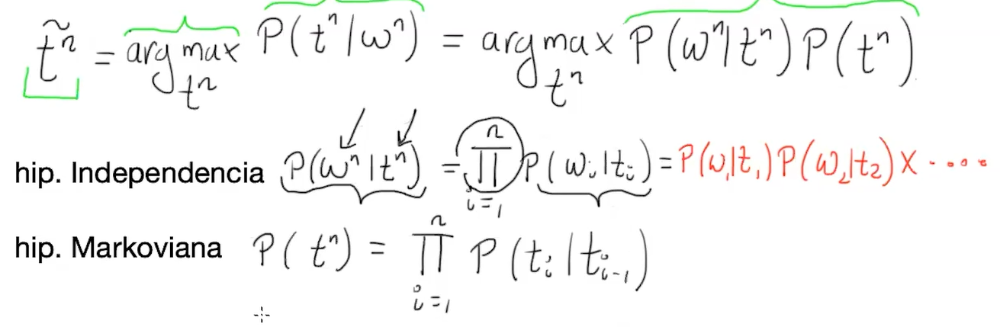

#### Corpus en español

In [14]:
!git clone https://github.com/UniversalDependencies/UD_Spanish-AnCora.git

fatal: destination path 'UD_Spanish-AnCora' already exists and is not an empty directory.


In [15]:
from conllu import parse_incr 
wordList = []
data_file = open("UD_Spanish-AnCora/es_ancora-ud-dev.conllu", "r", encoding="utf-8")
for tokenlist in parse_incr(data_file):
    print(tokenlist.serialize())

# global.Entity = eid-etype-head-other
# newdoc id = 3LB-CAST-111_C-2
# sent_id = 3LB-CAST-111_C-2-s1
# text = El gobernante, con ganada fama desde que llegó hace 16 meses al poder de explotar al máximo su oratoria y acusado por sus detractores de incontinencia verbal, enmudeció desde el momento en el que el Tribunal Supremo de Justicia (TSJ) decidió suspender temporalmente los comicios múltiples ante la imposibilidad "técnica" de celebrarlos el 28 de mayo.
1	El	el	DET	da0ms0	Definite=Def|Gender=Masc|Number=Sing|PronType=Art	2	det	2:det	_
2	gobernante	gobernante	NOUN	ncms000	Gender=Masc|Number=Sing	32	nsubj	32:nsubj	SpaceAfter=No|ArgTem=arg1:tem
3	,	,	PUNCT	fc	PunctType=Comm	6	punct	6:punct	_
4	con	con	ADP	sps00	_	6	case	6:case	_
5	ganada	ganado	ADJ	aq0fsp	Gender=Fem|Number=Sing|VerbForm=Part	6	amod	6:amod	_
6	fama	fama	NOUN	ncfs000	Gender=Fem|Number=Sing	2	nmod	2:nmod	_
7	desde	desde	ADP	sps00	_	9	mark	9:mark	_
8	que	que	SCONJ	cs	_	9	mark	9:mark	_
9	llegó	llegar	VERB	vmis3s0	Mood=Ind|

In [16]:
# tokenlist
tokenlist[1]

{'id': 2,
 'form': 'El',
 'lemma': 'el',
 'upos': 'DET',
 'xpos': 'da0ms0',
 'feats': {'Definite': 'Def',
  'Gender': 'Masc',
  'Number': 'Sing',
  'PronType': 'Art'},
 'head': 5,
 'deprel': 'det',
 'deps': [('det', 5)],
 'misc': {'Entity': '(NOCOREF:Gen--1-gstype:gen'}}

In [17]:
tokenlist[1]['form']+'|'+tokenlist[1]['upos']

'El|DET'

#### Entrenamiento del modelo - Calculo de conteos:

* tags (tags) `tagCountDict`: $C(tag)$
* emisiones (word|tag) `emissionProbDict`: $C(word|tag)$
* transiciones (tag|prevtag) `transitionDict`: $C(tag|prevtag)$

In [18]:
tagCountDict = {} 
emissionDict = {}
transitionDict = {}

tagtype = 'upos'
data_file = open("UD_Spanish-AnCora/es_ancora-ud-dev.conllu", "r", encoding="utf-8")

# Calculando conteos (pre-probabilidades)
for tokenlist in parse_incr(data_file):
    prevtag = None
    for token in tokenlist:

    # C(tag)
        tag = token[tagtype]
        if tag in tagCountDict.keys():
            tagCountDict[tag] += 1
        else:
            tagCountDict[tag] = 1

        # C(word|tag) -> probabilidades emision
        wordtag = token['form'].lower()+'|'+token[tagtype] # (word|tag)
        if wordtag in emissionDict.keys():
            emissionDict[wordtag] = emissionDict[wordtag] + 1
        else:
            emissionDict[wordtag] = 1

    #  C(tag|tag_previo) -> probabilidades transición
        if prevtag is None:
            prevtag = tag
            continue
        transitiontags = tag+'|'+prevtag
        if transitiontags in transitionDict.keys():
            transitionDict[transitiontags] = transitionDict[transitiontags] + 1
        else:
            transitionDict[transitiontags] = 1
        prevtag = tag
transitionDict
emissionDict
# tagCountDict

{'el|DET': 2763,
 'gobernante|NOUN': 2,
 ',|PUNCT': 2845,
 'con|ADP': 443,
 'ganada|ADJ': 1,
 'fama|NOUN': 1,
 'desde|ADP': 75,
 'que|SCONJ': 725,
 'llegó|VERB': 10,
 'hace|VERB': 41,
 '16|NUM': 11,
 'meses|NOUN': 27,
 'al|_': 349,
 'a|ADP': 1296,
 'poder|NOUN': 11,
 'de|ADP': 3933,
 'explotar|VERB': 2,
 'máximo|NOUN': 2,
 'su|DET': 350,
 'oratoria|NOUN': 1,
 'y|CCONJ': 1130,
 'acusado|ADJ': 3,
 'por|ADP': 509,
 'sus|DET': 139,
 'detractores|NOUN': 3,
 'incontinencia|NOUN': 1,
 'verbal|ADJ': 2,
 'enmudeció|VERB': 1,
 'momento|NOUN': 27,
 'en|ADP': 1300,
 'que|PRON': 788,
 'tribunal|PROPN': 4,
 'supremo|PROPN': 3,
 'justicia|PROPN': 6,
 '(|PUNCT': 219,
 'tsj|PROPN': 2,
 ')|PUNCT': 219,
 'decidió|VERB': 7,
 'suspender|VERB': 5,
 'temporalmente|ADV': 1,
 'los|DET': 801,
 'comicios|NOUN': 17,
 'múltiples|ADJ': 4,
 'ante|ADP': 47,
 'la|DET': 1873,
 'imposibilidad|NOUN': 1,
 '"|PUNCT': 914,
 'técnica|ADJ': 1,
 'celebrarlos|_': 1,
 'celebrar|VERB': 7,
 'los|PRON': 15,
 '28|NUM': 6,
 'mayo|NOU

Entrenamiento
* probabilidades de transición:
$$P(tag|prevtag) = \frac{C(prevtag, tag)}{C(prevtag)}$$

* probabilidades de emisión:
 $$P(word|tag) = \frac{C(word|tag)}{C(tag)}$$

In [19]:
transitionProbDict = {} # matriz A
emissionProbDict = {} # matriz B

tags = sorted(set([key.split("|")[0] for key in transitionDict.keys()]))

# transition Probabilities 
for key in transitionDict.keys():
    tag, prevtag = key.split('|')
    if tagCountDict[prevtag]>0:
        transitionProbDict[key] = transitionDict[key]/(tagCountDict[prevtag])
    else:
        print(key)

# emission Probabilities 
for key in emissionDict.keys():
    word, tag = key.split('|')
    if emissionDict[key]>0:
        emissionProbDict[key] = emissionDict[key]/tagCountDict[tag]
    else:
        print(key)

In [20]:
tags

['ADJ',
 'ADP',
 'ADV',
 'AUX',
 'CCONJ',
 'DET',
 'INTJ',
 'NOUN',
 'NUM',
 'PART',
 'PRON',
 'PROPN',
 'PUNCT',
 'SCONJ',
 'SYM',
 'VERB',
 '_']

In [21]:
transitionProbDict

{'NOUN|DET': 0.7051234338171443,
 'PUNCT|NOUN': 0.21745022412175544,
 'ADP|PUNCT': 0.10090433127082342,
 'ADJ|ADP': 0.012436935351402088,
 'NOUN|ADJ': 0.21575826037842416,
 'ADP|NOUN': 0.32356926925883456,
 'SCONJ|ADP': 0.017834095975595446,
 'VERB|SCONJ': 0.09595070422535211,
 'VERB|VERB': 0.029147490685952224,
 'NUM|VERB': 0.020600482138943676,
 'NOUN|NUM': 0.5239130434782608,
 '_|NOUN': 0.05962681121651204,
 'ADP|_': 0.8613312202852615,
 'DET|ADP': 0.5141382142438109,
 'VERB|ADP': 0.057022175290390706,
 '_|VERB': 0.03550295857988166,
 'DET|NOUN': 0.014177004065464401,
 'CCONJ|NOUN': 0.04951527155217346,
 'ADJ|CCONJ': 0.08459422283356259,
 'ADP|ADJ': 0.24936458627506355,
 'NOUN|ADP': 0.19464977120732135,
 'ADJ|NOUN': 0.17043677681642866,
 'PUNCT|ADJ': 0.24795255577520475,
 'VERB|PUNCT': 0.06964937331429479,
 'ADP|VERB': 0.24479509094893712,
 'PRON|DET': 0.01786378861183476,
 'DET|PRON': 0.024761904761904763,
 'PROPN|DET': 0.12095273539263118,
 'PROPN|PROPN': 0.22665345553628932,
 'AD

In [22]:
emissionProbDict

{'el|DET': 0.3427614439895795,
 'gobernante|NOUN': 0.00020848535390388824,
 ',|PUNCT': 0.45137236236712674,
 'con|ADP': 0.051977003402557787,
 'ganada|ADJ': 0.0002824060999717594,
 'fama|NOUN': 0.00010424267695194412,
 'desde|ADP': 0.008799718409010912,
 'que|SCONJ': 0.6382042253521126,
 'llegó|VERB': 0.0021915406530791147,
 'hace|VERB': 0.00898531667762437,
 '16|NUM': 0.011956521739130435,
 'meses|NOUN': 0.0028145522777024913,
 'al|_': 0.2765451664025357,
 'a|ADP': 0.15205913410770855,
 'poder|NOUN': 0.0011466694464713854,
 'de|ADP': 0.4614572333685322,
 'explotar|VERB': 0.00043830813061582295,
 'máximo|NOUN': 0.00020848535390388824,
 'su|DET': 0.043418930653765044,
 'oratoria|NOUN': 0.00010424267695194412,
 'y|CCONJ': 0.7771664374140302,
 'acusado|ADJ': 0.0008472182999152782,
 'por|ADP': 0.05972075560248739,
 'sus|DET': 0.01724351817392383,
 'detractores|NOUN': 0.0003127280308558324,
 'incontinencia|NOUN': 0.00010424267695194412,
 'verbal|ADJ': 0.0005648121999435188,
 'enmudeció|VERB

#### Guardar el modelo

In [23]:
import numpy as np
np.save('models/transitionHMM.npy', transitionProbDict)
np.save('models/emissionHMM.npy', emissionProbDict)

In [24]:
transitionProbdict = np.load('models/transitionHMM.npy', allow_pickle='TRUE').item()
transitionProbDict['ADJ|ADJ']

0.030217452696978255

## El algoritmo de Viterbi

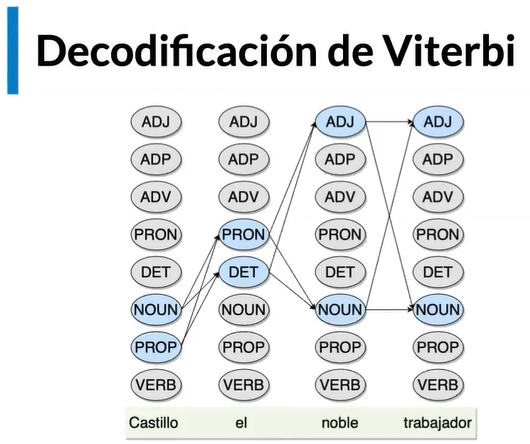

Se busca el camino más probable en base a los modelos Markovianos

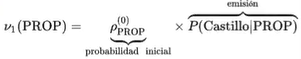

El proceso mediante el cual un Modelo Markoviano Latente determina la secuencia de etiquetas más probable para una secuencia de palabras es: el producto de a probabilidad inicial de encontrar esa etiqueta en la primera parte de esa secuencia este multiplicado por una probabilidad condicional.

### Cálculos de probabilidades de viterbi

Podemos asimilar este cálculo con una especie de árbol de decisión, en donde siempre va a elegir el camino con mayor probabilidad en base a la clasificación de cada palabra.

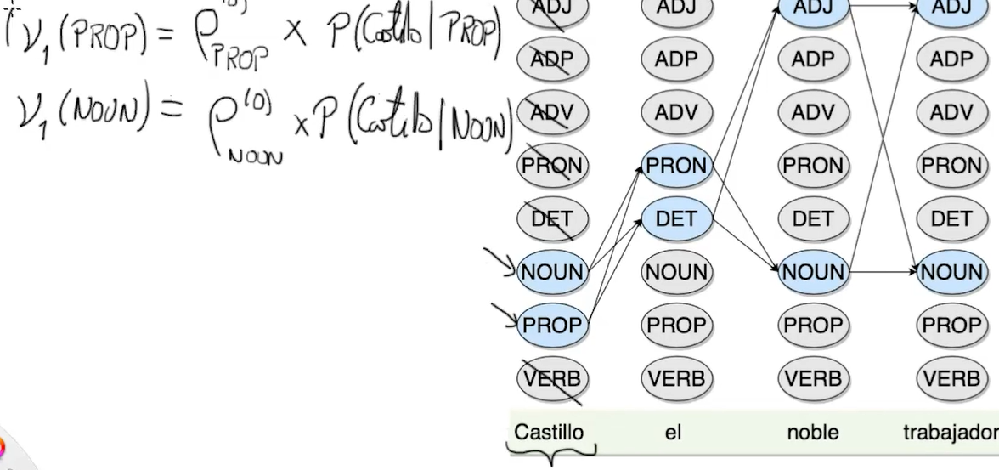

Estas probabilidades se calculan en base a los nodos anteriores:

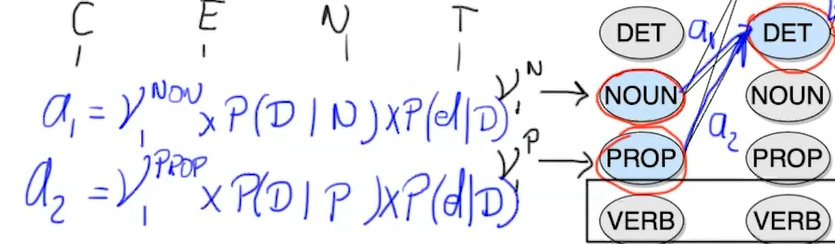

$$\tilde{t^n} = \argmax_{(t^n)}\prod_i P(w_i|t_i)P(t_i|t_{i-1})$$

$$v_t(j)=\max_i{v_{t-1}(i)\times C_{ij}\times P(palabra|j)}$$

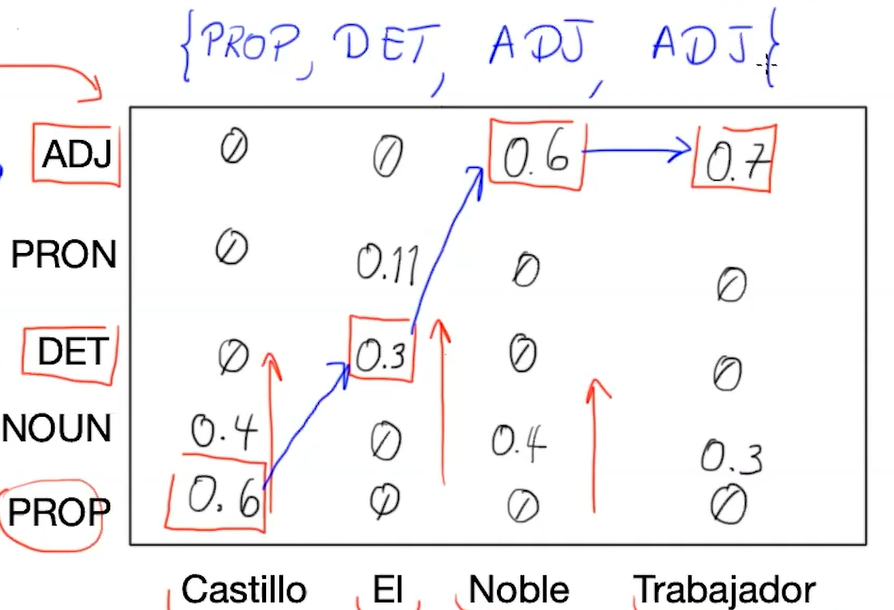

In [25]:
# cargamos las probabilidades del modelo HMM
import numpy as np
transitionProbdict = np.load('models/transitionHMM.npy', allow_pickle='TRUE').item()
emissionProbdict = np.load('models/emissionHMM.npy', allow_pickle='TRUE').item()

In [26]:
# identificamos las categorias gramaticales 'upos' unicas en el corpus
stateSet = set([w.split('|')[1] for w in list(emissionProbdict.keys())])
stateSet

{'ADJ',
 'ADP',
 'ADV',
 'AUX',
 'CCONJ',
 'DET',
 'INTJ',
 'NOUN',
 'NUM',
 'PART',
 'PRON',
 'PROPN',
 'PUNCT',
 'SCONJ',
 'SYM',
 'VERB',
 '_'}

In [27]:
# enumeramos las categorias con numeros para asignar a 
# las columnas de la matriz de Viterbi
tagStateDict = {}
for i, state in enumerate(stateSet):
    tagStateDict[state] = i
tagStateDict

{'PART': 0,
 'SCONJ': 1,
 'ADV': 2,
 'NOUN': 3,
 'CCONJ': 4,
 'PUNCT': 5,
 'VERB': 6,
 'DET': 7,
 'ADJ': 8,
 'PROPN': 9,
 'ADP': 10,
 'NUM': 11,
 'PRON': 12,
 '_': 13,
 'AUX': 14,
 'INTJ': 15,
 'SYM': 16}

### Distribución de estados latentes

In [28]:
# Calculamos distribución inicial de estados
initTagStateProb = {} # \rho_i^{(0)}
from conllu import parse_incr 
wordList = []
data_file = open("UD_Spanish-AnCora/es_ancora-ud-dev.conllu", "r", encoding="utf-8")
count = 0 # cuenta la longitud del corpus
for tokenlist in parse_incr(data_file):
    count += 1
    tag = tokenlist[0]['upos']
    if tag in initTagStateProb.keys():
        initTagStateProb[tag] += 1
    else:
        initTagStateProb[tag] = 1

for key in initTagStateProb.keys():
    initTagStateProb[key] /= count

initTagStateProb

{'DET': 0.36275695284159615,
 'PROPN': 0.1124546553808948,
 'ADP': 0.15538089480048367,
 'PRON': 0.06348246674727932,
 'SCONJ': 0.02418379685610641,
 'ADV': 0.056831922611850064,
 'PUNCT': 0.08222490931076179,
 'VERB': 0.02418379685610641,
 'ADJ': 0.010882708585247884,
 'CCONJ': 0.032648125755743655,
 'NOUN': 0.02720677146311971,
 '_': 0.009068923821039904,
 'INTJ': 0.0006045949214026602,
 'AUX': 0.016324062877871828,
 'NUM': 0.01995163240628779,
 'PART': 0.0018137847642079807}

In [29]:
sum(initTagStateProb.values())

0.9999999999999999

### Contrucción del algoritmo 

Dada una secuencia de palabras $\{p_1, p_2, \dots, p_n \}$, y un conjunto de categorias gramaticales dadas por la convención `upos`, se considera la matriz de probabilidades de Viterbi así:

$$
\begin{array}{c c}
\begin{array}{c c c c}
\text{ADJ} \\
\text{ADV}\\
\text{PRON} \\
\vdots \\
{}
\end{array} 
&
\left[
\begin{array}{c c c c}
\nu_1(\text{ADJ}) & \nu_2(\text{ADJ}) & \dots  & \nu_n(\text{ADJ})\\
\nu_1(\text{ADV}) & \nu_2(\text{ADV}) & \dots  & \nu_n(\text{ADV})\\ 
\nu_1(\text{PRON}) & \nu_2(\text{PRON}) & \dots  & \nu_n(\text{PRON})\\
\vdots & \vdots & \dots & \vdots \\ \hdashline
p_1 & p_2 & \dots & p_n 
\end{array}
\right] 
\end{array}
$$

Donde las probabilidades de la primera columna (para una categoria $i$) están dadas por: 

$$
\nu_1(i) = \underbrace{\rho_i^{(0)}}_{\text{probabilidad inicial}} \times \underbrace{P(p_1 \vert i)}_{\text{emisión}}
$$

luego, para la segunda columna (dada una categoria $j$) serán: 

$$
\nu_2(j) = \max_i \{ \nu_1(i) \times \underbrace{P(j \vert i)}_{\text{transición}} \times \underbrace{P(p_2 \vert j)}_{\text{emisión}} \}
$$

así, en general las probabilidades para la columna $t$ estarán dadas por: 

$$
\nu_{t}(j) = \max_i \{ \overbrace{\nu_{t-1}(i)}^{\text{estado anterior}} \times \underbrace{P(j \vert i)}_{\text{transición}} \times \underbrace{P(p_t \vert j)}_{\text{emisión}} \}
$$

In [30]:
import nltk
nltk.download('punkt')
from nltk import word_tokenize

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\JUAN\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [31]:
def ViterbiMatrix(secuencia, transitionProbdict=transitionProbdict, emissionProbdict=emissionProbdict, 
            tagStateDict=tagStateDict, initTagStateProb=initTagStateProb):
    seq = word_tokenize(secuencia)
    viterbiProb = np.zeros((17, len(seq)))  # upos tiene 17 categorias

    # inicialización primera columna
    for key in tagStateDict.keys():
        tag_row = tagStateDict[key]
        word_tag = seq[0].lower()+'|'+key
        if word_tag in emissionProbdict.keys():
            viterbiProb[tag_row, 0] = initTagStateProb[key]*emissionProbdict[word_tag]

    # computo de las siguientes columnas
    for col in range(1, len(seq)):
        for key in tagStateDict.keys():
            tag_row = tagStateDict[key]
            word_tag = seq[col].lower()+'|'+key
            if word_tag in emissionProbdict.keys():
            # miramos estados de la col anterior
                possible_probs = []
                for key2 in tagStateDict.keys(): 
                    tag_row2 = tagStateDict[key2]
                    tag_prevtag = key+'|'+key2
                    if tag_prevtag in transitionProbdict.keys():
                        if viterbiProb[tag_row2, col-1]>0:
                            possible_probs.append(
                            viterbiProb[tag_row2, col-1]*transitionProbdict[tag_prevtag]*emissionProbdict[word_tag])
                viterbiProb[tag_row, col] = max(possible_probs)

    return viterbiProb

matrix = ViterbiMatrix('el mundo es pequeño')
matrix

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 2.01067137e-04, 3.84542966e-10, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 6.84724476e-09, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.24339097e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.48896690e-10],
       [0.00000000e+00, 3.72532918e-05, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e

In [32]:
def ViterbiTags(secuencia, transitionProbdict=transitionProbdict, emissionProbdict=emissionProbdict, 
            tagStateDict=tagStateDict, initTagStateProb=initTagStateProb):
  seq = word_tokenize(secuencia)
  viterbiProb = np.zeros((17, len(seq)))  # upos tiene 17 categorias

  # inicialización primera columna
  for key in tagStateDict.keys():
    tag_row = tagStateDict[key]
    word_tag = seq[0].lower()+'|'+key
    if word_tag in emissionProbdict.keys():
      viterbiProb[tag_row, 0] = initTagStateProb[key]*emissionProbdict[word_tag]

  # computo de las siguientes columnas
  for col in range(1, len(seq)):
    for key in tagStateDict.keys():
      tag_row = tagStateDict[key]
      word_tag = seq[col].lower()+'|'+key
      if word_tag in emissionProbdict.keys():
        # miramos estados de la col anterior
        possible_probs = []
        for key2 in tagStateDict.keys(): 
          tag_row2 = tagStateDict[key2]
          tag_prevtag = key+'|'+key2
          if tag_prevtag in transitionProbdict.keys():
            if viterbiProb[tag_row2, col-1]>0:
              possible_probs.append(
                  viterbiProb[tag_row2, col-1]*transitionProbdict[tag_prevtag]*emissionProbdict[word_tag])
        viterbiProb[tag_row, col] = max(possible_probs)

    # contruccion de secuencia de tags
    res = []
    for i, p in enumerate(seq):
      for tag in tagStateDict.keys():
        if tagStateDict[tag] == np.argmax(viterbiProb[:, i]):
          res.append((p, tag))
      
  return res

ViterbiTags('el mundo es muy pequeño')

[('el', 'DET'),
 ('mundo', 'NOUN'),
 ('es', 'AUX'),
 ('muy', 'ADV'),
 ('pequeño', 'ADJ')]

In [33]:
ViterbiTags('estos instrumentos han de rasgar')

[('estos', 'DET'),
 ('instrumentos', 'NOUN'),
 ('han', 'AUX'),
 ('de', 'ADP'),
 ('rasgar', 'VERB')]

### Entrenamiento con NLTK

In [34]:
import nltk
nltk.download('treebank')
from nltk.corpus import treebank
train_data = treebank.tagged_sents()[:3900]

[nltk_data] Downloading package treebank to
[nltk_data]     C:\Users\JUAN\AppData\Roaming\nltk_data...
[nltk_data]   Package treebank is already up-to-date!


In [35]:
train_data

[[('Pierre', 'NNP'), ('Vinken', 'NNP'), (',', ','), ('61', 'CD'), ('years', 'NNS'), ('old', 'JJ'), (',', ','), ('will', 'MD'), ('join', 'VB'), ('the', 'DT'), ('board', 'NN'), ('as', 'IN'), ('a', 'DT'), ('nonexecutive', 'JJ'), ('director', 'NN'), ('Nov.', 'NNP'), ('29', 'CD'), ('.', '.')], [('Mr.', 'NNP'), ('Vinken', 'NNP'), ('is', 'VBZ'), ('chairman', 'NN'), ('of', 'IN'), ('Elsevier', 'NNP'), ('N.V.', 'NNP'), (',', ','), ('the', 'DT'), ('Dutch', 'NNP'), ('publishing', 'VBG'), ('group', 'NN'), ('.', '.')], ...]

In [36]:
from nltk.tag import hmm
tagger = hmm.HiddenMarkovModelTrainer().train_supervised(train_data)
tagger

<HiddenMarkovModelTagger 46 states and 12385 output symbols>

In [37]:
tagger.tag("Pierre Vinken will get old".split())

c:\Users\JUAN\anaconda3\envs\envML\lib\site-packages\nltk\tag\hmm.py:334: RuntimeWarning: overflow encountered in cast
  X[i, j] = self._transitions[si].logprob(self._states[j])
c:\Users\JUAN\anaconda3\envs\envML\lib\site-packages\nltk\tag\hmm.py:336: RuntimeWarning: overflow encountered in cast
  O[i, k] = self._output_logprob(si, self._symbols[k])
c:\Users\JUAN\anaconda3\envs\envML\lib\site-packages\nltk\tag\hmm.py:332: RuntimeWarning: overflow encountered in cast
  P[i] = self._priors.logprob(si)


[('Pierre', 'NNP'),
 ('Vinken', 'NNP'),
 ('will', 'MD'),
 ('get', 'VB'),
 ('old', 'JJ')]

In [38]:
tagger.accuracy(treebank.tagged_sents()[:3900])

0.9815403947224078

Ejemplo

In [39]:
from conllu import parse_incr 
data_file = open("UD_Spanish-AnCora/es_ancora-ud-dev.conllu", "r", encoding="utf-8") 

# Hacemos la transformacion del corpus al formato requerido
wordList = []
for tokenlist in parse_incr(data_file): 
    wordList2 = []
    for token in tokenlist:
        tag = token['upos']
        valor = token['form']
        wordList2.append((valor,tag)) 
    wordList.append(wordList2)

import nltk
from nltk.tag import hmm
from sklearn.model_selection import train_test_split

# Separamos el corpus
wordList_train, wordList_test= train_test_split(wordList, test_size=0.20, random_state=42)

# Entrenamos el modelo
tagger = hmm.HiddenMarkovModelTrainer().train_supervised(wordList_train)
tagger

print(tagger.accuracy(wordList_test))
print(tagger.accuracy(wordList_train))

c:\Users\JUAN\anaconda3\envs\envML\lib\site-packages\nltk\tag\hmm.py:364: RuntimeWarning: overflow encountered in cast
  O[i, k] = self._output_logprob(si, self._symbols[k])


0.27693718477762497
0.9856544056665097


## Modelos Markovianos de máxima entroía MEMM

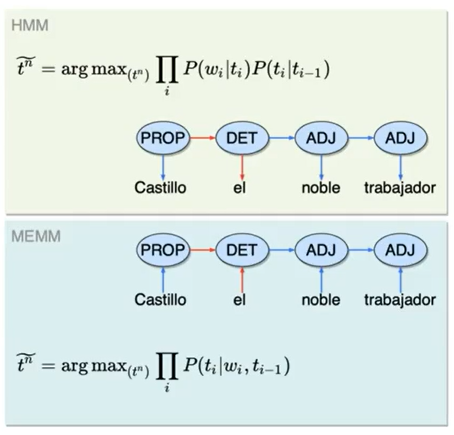

Es un modelo gráfico discriminativo, basado en regresión logística multinomial, que permite el etiquetado de secuencias y es utilizado para el POS Tagging. ... Fi(o,q) indica una función característica sobre una propiedad de la observación.

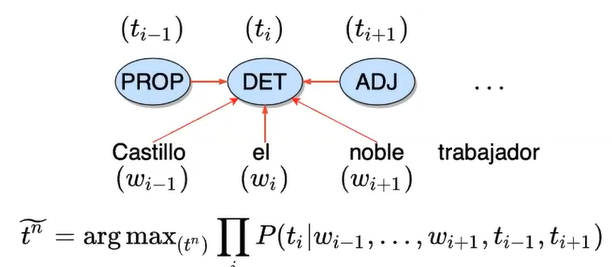

### Viterbi para MEMM

El algoritmo de Viterbi es un algoritmo de programación dinámica que permite hallar la secuencia más probable de estados ocultos (el llamado camino de Viterbi) que produce una secuencia observada de sucesos

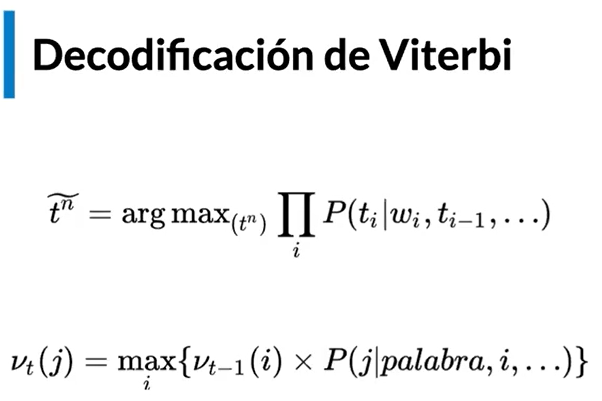

In [40]:
uniqueFeatureDict = {}
contextDict = {}

tagtype = 'upos'
data_file = open("UD_Spanish-AnCora/es_ancora-ud-train.conllu", "r", encoding="utf-8")

#Calculando conteos (pre-probabilidades)
for tokenlist in parse_incr(data_file):
    prevtag = "None"
    for token in tokenlist:
        tag = token[tagtype]
        word = token['form'].lower()
        #c(tag|word,prevtag)
        largeKey = tag+'|'+word+','+prevtag
        if largeKey in uniqueFeatureDict.keys():
            uniqueFeatureDict[largeKey]+=1
        else:
            uniqueFeatureDict[largeKey]=1
        key = word+','+prevtag
        if key in contextDict.keys():
            contextDict[key]+=1
        else:
            contextDict[key]=1
    #print(largeKey, key, '\n')
    prevtag=tag

## Clasificación de texto

Anteriorimente clasificamos un caso específico de las palabras, pero de un texto podemos extraer mucha información, como sentimientos, temas, si un correo es Spam, etc.

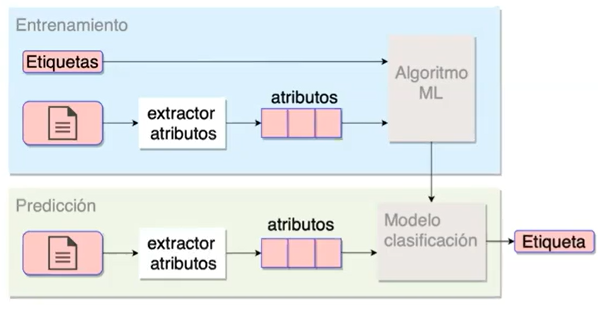

### Clasificación de nombres

In [2]:
import nltk, random
from nltk.corpus import names

In [3]:
names.words()

['Abagael',
 'Abagail',
 'Abbe',
 'Abbey',
 'Abbi',
 'Abbie',
 'Abby',
 'Abigael',
 'Abigail',
 'Abigale',
 'Abra',
 'Acacia',
 'Ada',
 'Adah',
 'Adaline',
 'Adara',
 'Addie',
 'Addis',
 'Adel',
 'Adela',
 'Adelaide',
 'Adele',
 'Adelice',
 'Adelina',
 'Adelind',
 'Adeline',
 'Adella',
 'Adelle',
 'Adena',
 'Adey',
 'Adi',
 'Adiana',
 'Adina',
 'Adora',
 'Adore',
 'Adoree',
 'Adorne',
 'Adrea',
 'Adria',
 'Adriaens',
 'Adrian',
 'Adriana',
 'Adriane',
 'Adrianna',
 'Adrianne',
 'Adrien',
 'Adriena',
 'Adrienne',
 'Aeriel',
 'Aeriela',
 'Aeriell',
 'Ag',
 'Agace',
 'Agata',
 'Agatha',
 'Agathe',
 'Aggi',
 'Aggie',
 'Aggy',
 'Agna',
 'Agnella',
 'Agnes',
 'Agnese',
 'Agnesse',
 'Agneta',
 'Agnola',
 'Agretha',
 'Aida',
 'Aidan',
 'Aigneis',
 'Aila',
 'Aile',
 'Ailee',
 'Aileen',
 'Ailene',
 'Ailey',
 'Aili',
 'Ailina',
 'Ailyn',
 'Aime',
 'Aimee',
 'Aimil',
 'Aina',
 'Aindrea',
 'Ainslee',
 'Ainsley',
 'Ainslie',
 'Ajay',
 'Alaine',
 'Alameda',
 'Alana',
 'Alanah',
 'Alane',
 'Alanna',
 

In [10]:
def atributes(word):
    return {'last_letter': word[-1]}

tagset = [(name, "male") for name in names.words("male.txt")] + [(name, "female") for name in names.words("female.txt")]
random.shuffle(tagset)
tagset[:10]

[('Emile', 'male'),
 ('Rab', 'male'),
 ('Analise', 'female'),
 ('Arlinda', 'female'),
 ('Ofelia', 'female'),
 ('Lucinda', 'female'),
 ('Wolfgang', 'male'),
 ('Ashlen', 'female'),
 ('Diannne', 'female'),
 ('Marcelle', 'female')]

In [11]:
len(tagset)

7944

Datos de entrenamiento

In [17]:
train_size = int(len(tagset) * 0.8)

fset = [(atributes(name), gender) for (name, gender) in tagset]
train, test = fset[:train_size], fset[train_size:]

Modelado

In [19]:
classifier = nltk.NaiveBayesClassifier.train(train)

In [29]:
classifier.classify(atributes("Juan"))

'male'

Métricas

In [30]:
nltk.classify.accuracy(classifier, test)

0.7507866582756451

Mejores atributos

In [31]:
import string

In [32]:
def best_atributes(name):
    atributes = {}
    atributes["first_letter"] = name[0].lower()
    atributes["last_letter"] = name[-1].lower()
    
    for letter in string.ascii_lowercase:
        atributes["count ({})".format(letter)] = name.lower().count(letter)
        atributes["has ({})".format(letter)] = (letter in name.lower())
    
    return atributes

In [34]:
best_atributes("Juan")

{'first_letter': 'j',
 'last_letter': 'n',
 'count (a)': 1,
 'has (a)': True,
 'count (b)': 0,
 'has (b)': False,
 'count (c)': 0,
 'has (c)': False,
 'count (d)': 0,
 'has (d)': False,
 'count (e)': 0,
 'has (e)': False,
 'count (f)': 0,
 'has (f)': False,
 'count (g)': 0,
 'has (g)': False,
 'count (h)': 0,
 'has (h)': False,
 'count (i)': 0,
 'has (i)': False,
 'count (j)': 1,
 'has (j)': True,
 'count (k)': 0,
 'has (k)': False,
 'count (l)': 0,
 'has (l)': False,
 'count (m)': 0,
 'has (m)': False,
 'count (n)': 1,
 'has (n)': True,
 'count (o)': 0,
 'has (o)': False,
 'count (p)': 0,
 'has (p)': False,
 'count (q)': 0,
 'has (q)': False,
 'count (r)': 0,
 'has (r)': False,
 'count (s)': 0,
 'has (s)': False,
 'count (t)': 0,
 'has (t)': False,
 'count (u)': 1,
 'has (u)': True,
 'count (v)': 0,
 'has (v)': False,
 'count (w)': 0,
 'has (w)': False,
 'count (x)': 0,
 'has (x)': False,
 'count (y)': 0,
 'has (y)': False,
 'count (z)': 0,
 'has (z)': False}

In [33]:
train_size = int(len(tagset) * 0.8)

fset = [(best_atributes(name), gender) for (name, gender) in tagset]
train, test = fset[:train_size], fset[train_size:]

In [35]:
classifier = nltk.NaiveBayesClassifier.train(train)

In [39]:
classifier.classify(best_atributes("Juan"))

'male'

In [37]:
nltk.classify.accuracy(classifier, test)

0.7658904971680303

### Clasificación de documentos

In [40]:
!git clone https://github.com/pachocamacho1990/datasets

Cloning into 'datasets'...


In [41]:
import pandas as pd
import numpy as np
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
from nltk import word_tokenize

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\JUAN\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\JUAN\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [42]:
df = pd.read_csv('datasets/email/csv/spam-apache.csv', names = ['clase','contenido'])
df['tokens'] = df['contenido'].apply(lambda x: word_tokenize(x))
df.head()

,clase,contenido,tokens
0,-1,"<!DOCTYPE HTML PUBLIC ""-//W3C//DTD HTML 4.0 Tr...","[<, !, DOCTYPE, HTML, PUBLIC, ``, -//W3C//DTD,..."
1,1,> Russell Turpin:\r\n> > That depends on how t...,"[>, Russell, Turpin, :, >, >, That, depends, o..."
2,-1,Help wanted. We are a 14 year old fortune 500...,"[Help, wanted, ., We, are, a, 14, year, old, f..."
3,-1,Request A Free No Obligation Consultation!\r\n...,"[Request, A, Free, No, Obligation, Consultatio..."
4,1,Is there a way to look for a particular file o...,"[Is, there, a, way, to, look, for, a, particul..."


In [44]:
all_words = nltk.FreqDist([w for tokenlist in df['tokens'].values for w in tokenlist])
top_words = all_words.most_common(200)

def document_features(document):
    document_words = set(document)
    features = {}
    for word in top_words:
        features['contains({})'.format(word)] = (word in document_words)
    return features

In [45]:
document_features(df['tokens'].values[0])

{"contains((',', 2173))": False,
 "contains(('.', 2171))": False,
 "contains(('the', 1967))": False,
 "contains(('>', 1787))": False,
 "contains(('--', 1611))": False,
 "contains(('to', 1435))": False,
 "contains((':', 1220))": False,
 "contains(('*', 1149))": False,
 "contains(('and', 1064))": False,
 "contains(('of', 958))": False,
 "contains(('a', 879))": False,
 "contains(('you', 744))": False,
 "contains(('in', 742))": False,
 "contains(('I', 741))": False,
 "contains(('<', 718))": False,
 "contains(('!', 698))": False,
 "contains(('%', 677))": False,
 "contains(('for', 609))": False,
 "contains(('is', 578))": False,
 "contains(('#', 521))": False,
 "contains(('BR', 494))": False,
 "contains(('that', 479))": False,
 "contains((')', 463))": False,
 "contains(('it', 458))": False,
 'contains(("\'\'", 434))': False,
 "contains(('$', 413))": False,
 "contains(('this', 384))": False,
 "contains(('(', 380))": False,
 "contains(('on', 378))": False,
 "contains(('http', 362))": False,
 "c

In [47]:
fset = [(document_features(texto), clase) for texto, clase in zip(df['tokens'].values, df['clase'].values)]
random.shuffle(fset)
train, test = fset[:200], fset[200:]

In [48]:
classifier = nltk.NaiveBayesClassifier.train(train)
nltk.classify.accuracy(classifier, test)

0.48

In [49]:
classifier.show_most_informative_features(5)

Most Informative Features
     contains(("'", 95)) = False              -1 : 1      =      1.0 : 1.0
   contains(("''", 434)) = False              -1 : 1      =      1.0 : 1.0
    contains(("'m", 51)) = False              -1 : 1      =      1.0 : 1.0
   contains(("'re", 41)) = False              -1 : 1      =      1.0 : 1.0
   contains(("'s", 263)) = False              -1 : 1      =      1.0 : 1.0


In [50]:
df[df['clase']==-1]['contenido']

0      <!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Tr...
2      Help wanted.  We are a 14 year old fortune 500...
3      Request A Free No Obligation Consultation!\r\n...
10     >\r\n>“µ×è¹µÑÇ ¡ÑºâÅ¡¸ØÃ¡Ô¨º¹ÍÔ¹àµÍÃìà¹çµ” \r\...
11     ==============================================...
                             ...                        
243    ##############################################...
244    Wanna see sexually curious teens playing with ...
246    REQUEST FOR URGENT BUSINESS ASSISTANCE\r\n----...
248    Email marketing works!  There's no way around ...
249    Email marketing works!  There's no way around ...
Name: contenido, Length: 125, dtype: object

## Naive Bayes Classifier

Recordemos que un clasificador probabilistico le da una probabilidad a cada categoría que puede obtener un documento.

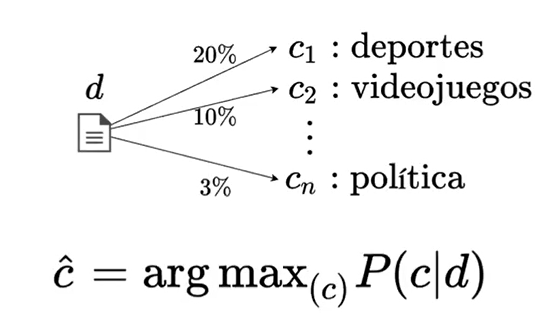

In [53]:
import math
import os

In [74]:
os.listdir('datasets/email/plaintext/corpus1/corpus1/spam')

['0006.2003-12-18.GP.spam.txt',
 '0008.2003-12-18.GP.spam.txt',
 '0017.2003-12-18.GP.spam.txt',
 '0018.2003-12-18.GP.spam.txt',
 '0026.2003-12-18.GP.spam.txt',
 '0032.2003-12-19.GP.spam.txt',
 '0040.2003-12-19.GP.spam.txt',
 '0041.2003-12-19.GP.spam.txt',
 '0046.2003-12-20.GP.spam.txt',
 '0052.2003-12-20.GP.spam.txt',
 '0054.2003-12-21.GP.spam.txt',
 '0058.2003-12-21.GP.spam.txt',
 '0061.2003-12-21.GP.spam.txt',
 '0062.2003-12-22.GP.spam.txt',
 '0065.2003-12-23.GP.spam.txt',
 '0069.2003-12-23.GP.spam.txt',
 '0072.2003-12-24.GP.spam.txt',
 '0073.2003-12-24.GP.spam.txt',
 '0075.2003-12-24.GP.spam.txt',
 '0080.2003-12-25.GP.spam.txt',
 '0082.2003-12-25.GP.spam.txt',
 '0084.2003-12-27.GP.spam.txt',
 '0088.2003-12-27.GP.spam.txt',
 '0093.2003-12-28.GP.spam.txt',
 '0094.2003-12-28.GP.spam.txt',
 '0100.2003-12-28.GP.spam.txt',
 '0102.2003-12-28.GP.spam.txt',
 '0103.2003-12-29.GP.spam.txt',
 '0104.2003-12-29.GP.spam.txt',
 '0105.2003-12-29.GP.spam.txt',
 '0108.2003-12-30.GP.spam.txt',
 '0110.2

In [84]:
data = []
clases = []
#lectura de spam data
for file in os.listdir('datasets\email\plaintext\corpus1\spam'):
    with open("datasets/email/plaintext/corpus1/spam/"+file, encoding="latin-1") as f:
        data.append(f.read())
        clases.append('spam')
#lectura de ham data
for file in os.listdir('datasets/email/plaintext/corpus1/ham'):
    with open('datasets/email/plaintext/corpus1/ham/'+file, encoding='latin-1') as f:
        data.append(f.read())
        clases.append('ham')
len(data)

5172

### Contrucción del modelo

#### Tokenizador de Spacy

In [85]:
from spacy.tokenizer import Tokenizer
from spacy.lang.en import English

nlp = English()
tokenizer = Tokenizer(nlp.vocab)

In [86]:
print([t.text for t in tokenizer(data[0])])

['Subject:', 'dobmeos', 'with', 'hgh', 'my', 'energy', 'level', 'has', 'gone', 'up', '!', 'stukm', '\n', 'introducing', '\n', 'doctor', '-', 'formulated', '\n', 'hgh', '\n', 'human', 'growth', 'hormone', '-', 'also', 'called', 'hgh', '\n', 'is', 'referred', 'to', 'in', 'medical', 'science', 'as', 'the', 'master', 'hormone', '.', 'it', 'is', 'very', 'plentiful', '\n', 'when', 'we', 'are', 'young', ',', 'but', 'near', 'the', 'age', 'of', 'twenty', '-', 'one', 'our', 'bodies', 'begin', 'to', 'produce', '\n', 'less', 'of', 'it', '.', 'by', 'the', 'time', 'we', 'are', 'forty', 'nearly', 'everyone', 'is', 'deficient', 'in', 'hgh', ',', '\n', 'and', 'at', 'eighty', 'our', 'production', 'has', 'normally', 'diminished', 'at', 'least', '90', '-', '95', '%', '.', '\n', 'advantages', 'of', 'hgh', ':', '\n', '-', 'increased', 'muscle', 'strength', '\n', '-', 'loss', 'in', 'body', 'fat', '\n', '-', 'increased', 'bone', 'density', '\n', '-', 'lower', 'blood', 'pressure', '\n', '-', 'quickens', 'wound

Recuerda que la clase más probable viene dada por (en espacio de cómputo logarítmico): 


$$\hat{c} = {\arg \max}_{(c)}\log{P(c)}
 +\sum_{i=1}^n
\log{ P(f_i \vert c)}
$$

Donde, para evitar casos atípicos, usaremos el suavizado de Laplace así:

$$
P(f_i \vert c) = \frac{C(f_i, c)+1}{C(c) + \vert V \vert}
$$

siendo $\vert V \vert$ la longitud del vocabulario de nuestro conjunto de entrenamiento. 

In [87]:
import numpy as np

class NaiveBayesClassifier():
  nlp = English()
  tokenizer = Tokenizer(nlp.vocab)
  
  def tokenize(self, doc):
    return  [t.text.lower() for t in tokenizer(doc)]

  def word_counts(self, words):
    wordCount = {}
    for w in words: 
      if w in wordCount.keys():
        wordCount[w] += 1
      else:
        wordCount[w] = 1
    return wordCount

  def fit(self, data, clases):
    n = len(data)
    self.unique_clases = set(clases)
    self.vocab = set()
    self.classCount = {} #C(c)
    self.log_classPriorProb = {} #P(c)
    self.wordConditionalCounts = {} #C(w|c)
    #conteos de clases
    for c in clases:
      if c in self.classCount.keys():
        self.classCount[c] += 1
      else:
        self.classCount[c] = 1
    # calculo de P(c)
    for c in self.classCount.keys():
      self.log_classPriorProb[c] = math.log(self.classCount[c]/n)
      self.wordConditionalCounts[c] = {}
    # calculo de C(w|c)
    for text, c in zip(data, clases):
      counts = self.word_counts(self.tokenize(text))
      for word, count in counts.items():
        if word not in self.vocab:
          self.vocab.add(word)
        if word not in self.wordConditionalCounts[c]:
          self.wordConditionalCounts[c][word] = 0.0
        self.wordConditionalCounts[c][word] += count

  def predict(self, data):
    results = []
    for text in data:
      words = set(self.tokenize(text))
      scoreProb = {}
      for word in words: 
        if word not in self.vocab: continue #ignoramos palabras nuevas
        #suavizado Laplaciano para P(w|c)
        for c in self.unique_clases:
          log_wordClassProb = math.log(
              (self.wordConditionalCounts[c].get(word, 0.0)+1)/(self.classCount[c]+len(self.vocab)))
          scoreProb[c] = scoreProb.get(c, self.log_classPriorProb[c]) + log_wordClassProb
      arg_maxprob = np.argmax(np.array(list(scoreProb.values())))
      results.append(list(scoreProb.keys())[arg_maxprob])
    return results


In [88]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score
data_train, data_test, clases_train, clases_test = train_test_split(data, clases, test_size=0.10, random_state=42)

In [89]:
classifier = NaiveBayesClassifier()
classifier.fit(data_train, clases_train)

In [90]:
clases_predict = classifier.predict(data_test)
accuracy_score(clases_test, clases_predict), precision_score(clases_test, clases_predict, average=None, zero_division=1), recall_score(clases_test, clases_predict, average=None, zero_division=1)

(0.8725868725868726,
 array([0.84615385, 1.        ]),
 array([1.        , 0.57419355]))